In [ ]:
import numpy as np
from random import randint
from datetime import datetime

In [ ]:
def scale(A):
    n = len(A)
    m = len(A[0])
    for i in range(n):
        pivot = 0
        for j in range(m-1):
            if pivot < abs(A[i][j]):
                pivot =  abs(A[i][j])
        for j in range(m):
            A[i][j] /= pivot

def connectAB(A, b):
    for index, row in enumerate(A):
        row.append(b[index])


def solveEquations(A, b):
    connectAB(A, b)
    scale(A)
    n = len(A)
    m = len(A[0])
    for i in range(n):
        if i < m:
            pivot = 0
            pivotIndex = i
            for j in range(m-1):
                if abs(A[i][j]) > pivot:
                    pivot = abs(A[i][j])
                    pivotIndex = j

            for j in range(n):
                A[j][pivotIndex], A[j][i] = A[j][i], A[j][pivotIndex]
            
            for j in range(n):
                if j != i:
                    row = A[j].copy()
                    for k in range(m):
                        A[j][k] = A[j][k] * A[i][i] - row[i] * A[i][k]
    

    for i in range(n):
        A[i][m-1] /= A[i][i]
        A[i][i] /= A[i][i]
    


In [ ]:
n = 100
m = 100
A = [[0] * m for i in range(n)]
b = [randint(-100, 100) for i in range(n)]
for i in range(n):
    for j in range(m):
        A[i][j] = randint(-100, 100)


start = datetime.now()
x = np.linalg.solve(A, b)
end = datetime.now()
print(f"Time of library function = {end - start}")


start = datetime.now()
solveEquations(A, b)
end = datetime.now()

print(f"Time of my function = {end - start}")

Time of library function = 0:00:00.002124
Time of my function = 0:00:00.418191


Po zbadaniu czasów wykonania obu funkcji widzimy znaczną różnicę. Funkcja biblioteczna jest znacznie szybsza co widać dla dużych układów.

In [ ]:
def LU(n, A):
    for k in range(n-1):
        for i in range(k+1, n):
            A[i][k] /= A[k][k]
        for i in range(k+1, n):
            for j in range(k+1, n):
                A[i][j] -= A[i][k] * A [k][j]
    return A

In [ ]:
A = np.array([[3.0, 2.0, -4.0], [2.0, 3.0, 3], [5, -3.6, 1]], dtype=np.float64)

print(LU(len(A), A))

[[ 3.          2.         -4.        ]
 [ 0.66666667  1.66666667  5.66666667]
 [ 1.66666667 -4.16       31.24      ]]


In [ ]:
import networkx as nx

In [ ]:
def makeGraphFromInput(file):
    with open(file, mode='r', encoding='utf-8') as f:
        graph = nx.Graph()

        edgeData = f.readline().split(' ')
        for edge in edgeData:
            aux = edge.split('-')
            vertex1 = int(aux[0])
            vertex2 = int(aux[1])
            w = int(aux[2])
            graph.add_edge(vertex1, vertex2, weight=w)
        
        ste = f.readline().split(' ')
        s, t, e = int(ste[0]), int(ste[1]), int(ste[2])
        if graph.get_edge_data(s, t) == None:
            graph.add_edge(s, t, weight=0)
        
    return graph, s, t, e


Graf z pliku powinien być w formacie: <br />
**Linia1:** *krawędzie w formacie vertex1-vertex2-weight oddzielone spacją* <br />
**Linia2:** *wierzchołek_s wierzchołek_t napięcie_e*

In [ ]:
graph, s, t, e = makeGraphFromInput("/content/sample_data/inputGraph.txt")

FileNotFoundError: ignored

In [ ]:
def makePositionMatrix(graph):
    n = graph.number_of_nodes()
    edges = list(graph.edges)
    numberOfEdges = len(edges)
    positionMatrix = [[None] * n for i in range(n)]
    k = 0
    for i in range(n):
        for j in range(i, n):
            if graph.get_edge_data(i, j) != None:
                positionMatrix[i][j] = k 
                positionMatrix[j][i] = k
                k += 1

    return positionMatrix


def linearlyDependent(vector1, vector2):
    innerProduct = np.inner(vector1, vector2)
    norm1 = np.linalg.norm(vector1)
    norm2 = np.linalg.norm(vector2)
    if np.abs(innerProduct - norm1 * norm2) < 1E-5:
        return True
    
    return False


def makeCurrentQuotientMatrixAndVoltageVector(graph, positionMatrix, s, t, E):
    cycles = nx.cycle_basis(graph)
    edges = list(graph.edges)
    numberOfEdges = len(edges)
    voltage = [0] * numberOfEdges
    matrix = [[0] * numberOfEdges for i in range(numberOfEdges)]
    for index, cycle in enumerate(cycles):
        containsS = False
        containsT = False
        for i in range(len(cycle) - 1):
            node1 = cycle[i]
            node2 = cycle[i+1]
            if node1 == s:
                containsS = True
            if node1 == t:
                containsT = True
            if containsS and containsT:
                voltage[index] = E
            
        
            column = positionMatrix[node1][node2]
            matrix[index][column] = graph.get_edge_data(node1, node2)["weight"]
    
        
        node1 = cycle[len(cycle) - 1]
        node2 = cycle[0]
        if node1 == s:
            containsS = True
        if node1 == t:
            containsT = True
        if containsS and containsT:
            voltage[index] = E

        column = positionMatrix[node1][node2]
        matrix[index][column] = graph.get_edge_data(node1, node2)["weight"]


    nodes = list(graph.nodes)
    row = len(cycles)
    for node in nodes:
        edgesOfNode = graph.edges(node)
        equation = [0] * numberOfEdges
        for edge in edgesOfNode:
            node1 = edge[0]
            node2 = edge[1]
            column = positionMatrix[node1][node2]
            equation[column] = 1

        independent = True
        for i in range(row): 
            if linearlyDependent(equation, matrix[i]):
                independent = False
        if independent:
            matrix[row] = equation.copy()
            row += 1
        
        if row == numberOfEdges:
            break
    
    return matrix, voltage

In [ ]:
from random import randint
n = 200
d = 3
p = 0.1
graph = nx.erdos_renyi_graph(n, p)

edges = list(graph.edges(data=True))
resistances = np.random.uniform(0.0, 30.0, len(edges))
for i in range(len(edges)):
    edges[i][2]["weight"] = resistances[i]


whereVoltage = randint(0, n - 1)
s, t = edges[whereVoltage][0], edges[whereVoltage][1]
e = np.random.uniform(30.0, 100.0)
print(f"n = {n}, d = {d}, e = {e}, s = {s}, t = {t}")

n = 200, d = 3, e = 38.838505707222296, s = 8, t = 145


In [ ]:
def transposeMatrix(matrix):
    return [[matrix[j][i] for j in range(len(matrix))] for i in range(len(matrix[0]))]

In [ ]:
positionMatrix = makePositionMatrix(graph)

matrix, voltage = makeCurrentQuotientMatrixAndVoltageVector(graph, positionMatrix, s, t, e)

currents = np.linalg.solve(matrix, voltage)

In [ ]:
from math import ceil, floor
import matplotlib.pyplot as plt
import matplotlib as mpl


In [ ]:
def testResult(currents, positionMatrix):
    n = len(positionMatrix)
    for node in positionMatrix:
        sumCurrentsOfNode = 0
        for edge in node:
            if edge != None:
                sumCurrentsOfNode += currents[edge]
        
        if sumCurrentsOfNode >= 1E-5:
            print(sumCurrentsOfNode)
            return False
    
    return True

In [ ]:
print("The result is correct ", testResult(currents, positionMatrix))

The result is correct  True


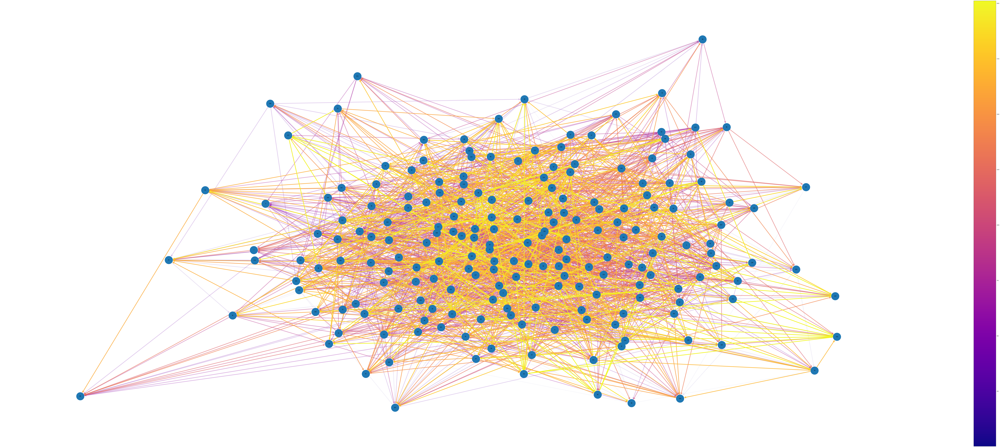

In [ ]:
directedGraph = nx.DiGraph()
edges = list(graph.edges)

for edge in edges:
    column = positionMatrix[edge[0]][edge[1]]
    weight = currents[column]
    if weight < 0:
        directedGraph.add_edge(edge[1], edge[0], weight=-weight)
    else:
        directedGraph.add_edge(edge[0], edge[1], weight=weight)



fig = plt.figure(1, figsize=(200, 80), dpi=60)
pos = nx.spring_layout(directedGraph, seed=30)
node_sizes = 6000
nx.draw_networkx_nodes(directedGraph, pos, node_size=node_sizes)
nodes = list(directedGraph.nodes)
labels = dict(zip(nodes, nodes))
alpha = 1.0
M = directedGraph.number_of_edges()
edge_colors = range(2, M + 2)
edge_alphas = [(5 + i) / (M + 4) for i in range(M)]
cmap = plt.cm.plasma

edges = nx.draw_networkx_edges(
    directedGraph,
    pos,
    node_size=node_sizes,
    arrowstyle="->",
    arrowsize=30,
    edge_color=edge_colors,
    edge_cmap=cmap,
    width=6,
)

nx.draw_networkx_labels(directedGraph, pos, labels)

for i in range(M):
    edges[i].set_alpha(edge_alphas[i])

pc = mpl.collections.PatchCollection(edges, cmap=cmap)
pc.set_array(edge_colors)
plt.colorbar(pc)

ax = plt.gca()
ax.set_axis_off()
plt.show()


Ponizszy graf przedstawia wynik dla grafu Erdosa Renyiego dla n=40, p = 0.2, e = 49.63982640028955, s = 4, t = 12

![picture](https://drive.google.com/uc?id=1AAtJn3jsew39yGdFm80lnqDMUJec9Pki)


Ponizszy graf przedstawia wynik dla grafu Erdosa Renyiego dla n = 100, p = 0.4, e = 94.1256006217539, s = 1, t = 82

![picture](https://drive.google.com/uc?id=1QegRn3x8eRVL48vx2GpqqV7LikBLiaOU)

Ponizszy graf przedstawia wynik dla grafu Erdosa Renyiego dla n = 200, p = 0.1, e = 38.838505707222296, s = 8, t = 145

![picture](https://drive.google.com/uc?id=1Eo8HEYmv5wz0eWlbkHdv3wqs7pGeEl9-)

Ponizszy graf przedstawia wynik dla grafu losowego 3-regularnego dla n=40, e = 47.333279356428974, s = 28, t = 16

![picture](https://drive.google.com/uc?id=1O1IYenusrMP-LTBMMvOkuRCK8yN7VxsX)

Ponizszy graf przedstawia wynik dla grafu 3-regularnego n = 150, e = 74.62708821175809, s = 142, t = 57

![picture](https://drive.google.com/uc?id=1DHboSl5h4MfpJ_ZVmA0tkqv22M38nU1k)

# **Podsumowanie**

Wybrałem metodę praw Kirchoffa. Polegała ona na wyznaczeniu cykli prostych grafu za pomocą funkcji bibliotecznej Networkx. Następnie dla cykli otrzymywałem równania z drugiego prawa Kirchoffa. Całość uzupełniałem równaniami natężeń dla węzłów z pierwszego prawa Kirchoffa.
W przypadku układu nadokreślonego, możemy równanie macierzowe (Ax = b) obustronnie pomnożyć przez macierz transponowaną $\mathrm{A}^{T}$.  

W uzupełnianiu macierzy współczynników przy natężeniu I, zakładam że prąd zawsze płynie od wierzchołka o mniejszym indeksie do tego o większym indeksie. Grafem skierowanym jest dopiero graf końcowy z wagami jako natężenia. Rozwiązanie sprawdzam przy użyciu pierwszego prawa Kirchoffa. Przechodzę po wszystkich wierzchołkach i sprawdzam czy prawo jest zachowane dla wyznaczonych wartości natężenia. Graf końcowy jest ilustrowany z wagami jako odpowiednie kolory na skali, krawędzie są też skierowane. 